Desafio Cientista de Dados

In [1]:
# Bibliotecas Utilizadas

# Data Wrangling / Visualization

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ydata_profiling
import seaborn as sns
from scipy import stats
from wordcloud import WordCloud
%matplotlib inline

# Preprocessing
from sklearn.preprocessing import StandardScaler, PowerTransformer, OrdinalEncoder, OneHotEncoder,LabelEncoder

# Models
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV, LinearRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier,GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Ridge, Lasso

# Models Pipelines
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Model evaluation

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV


# Análise exploratória dos dados 

In [2]:
df=pd.read_csv('teste_indicium_precificacao.csv')
df.head(15)


,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
2,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
3,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
4,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
5,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
6,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
7,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
8,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188
9,5295,Beautiful 1br on Upper West Side,7702,Lena,Manhattan,Upper West Side,40.80316,-73.96545,Entire home/apt,135,5,53,2019-06-22,0.43,1,6


Verificando as caracteristícas estatísticas

In [3]:
df.describe()

,id,host_id,latitude,longitude,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
count,4.889400e+04,4.889400e+04,48894.000000,48894.000000,48894.000000,48894.000000,48894.000000,38842.000000,48894.000000,48894.000000
mean,1.901753e+07,6.762139e+07,40.728951,-73.952169,152.720763,7.030085,23.274758,1.373251,7.144005,112.776169
std,1.098288e+07,7.861118e+07,0.054529,0.046157,240.156625,20.510741,44.550991,1.680453,32.952855,131.618692
min,2.595000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.472371e+06,7.822737e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967743e+07,3.079553e+07,40.723075,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915225e+07,1.074344e+08,40.763117,-73.936273,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [4]:
df.dtypes


id                                 int64
nome                              object
host_id                            int64
host_name                         object
bairro_group                      object
bairro                            object
latitude                         float64
longitude                        float64
room_type                         object
price                              int64
minimo_noites                      int64
numero_de_reviews                  int64
ultima_review                     object
reviews_por_mes                  float64
calculado_host_listings_count      int64
disponibilidade_365                int64
dtype: object

##### Vamos criar um 'report' geral dos dados, onde serão vistas diversas informações sobre o dataset

In [5]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


### Segundo o relatório acima pode-se afirmar que:

#### Existem dados faltantes.

#### Não há dados duplicados.

#### Alguns dados possuem valor zero.

#### Existem diversas correlações presentes, no entanto nem toda correlação possui causa. 

#### As colunas ‘ultima_review’ e ‘reviews_por_mes’ são as que apresentam a maior quantidade de dados nulos de forma significativa.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# Tratamento dos dados

Aqui será feita uma análise do porque tantos dados nulos nas tabelas ‘ultima_review’ e ‘reviews_por_mes'.
Considerando que, juntas, elas constituem 99% dos dados nulos, o que equivale a mais de 20.000 linhas.
O intuito é entender se é necessário dropar as linhas ou prencher de maneira apropriada.

In [6]:
# Somando a quantidade de nulos na tabela 'ultima_review'

df_ultima_review = len(df[df['ultima_review'].isna()])
print(f'{df_ultima_review}')

10052


In [7]:
# Somando a quantidade de nulos na tabela 'reviews_por_mes'

df_reviews_por_mes = len(df[df['reviews_por_mes'].isna()])
print(f'{df_reviews_por_mes}')

10052


#### A quantidade de valores nulos nas colunas é mesma , vamos mostrar o df apenas com os valores nulos agrupados para entender melhor .

In [8]:
# Agrupando as colunas com os valores nulos

df_nan = (df[df['ultima_review'].isna() & df['reviews_por_mes'].isna()])
df_nan.head(20)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
18,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
25,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
35,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
37,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365
192,51438,1 Bedroom in 2 Bdrm Apt- Upper East,236421,Jessica,Manhattan,Upper East Side,40.77333,-73.95199,Private room,130,14,0,NaN,NaN,2,0
203,54466,Beautiful Uptown Manhattan apartmnt,253385,Douglas,Manhattan,Harlem,40.80234,-73.95603,Private room,200,30,0,NaN,NaN,1,365
259,63588,LL3,295128,Carol Gloria,Bronx,Clason Point,40.81309,-73.85514,Private room,90,2,0,NaN,NaN,7,349
264,63913,"HOSTING YOUR SUNNY, SPACIOUS NYC ROOM",312288,Paula,Manhattan,Inwood,40.86648,-73.92630,Private room,75,7,0,NaN,NaN,2,323
266,64015,Prime East Village 1 Bedroom,146944,David,Manhattan,East Village,40.72807,-73.98594,Entire home/apt,200,3,0,NaN,NaN,1,0


#### Aparentemente a coluna 'numero_de_reviews' que mostra muitos valores com zero acompanha os resultados nulos , vamos contar quantos zeros a coluna possui.

In [9]:
# Calculo do número de zeros presentes na coluna 'numero_de_reviews'
numero_de_reviews = len(df[df['numero_de_reviews']==0])
print(f'{numero_de_reviews}')

10052


##### Como o número de zeros é exatamente igual ao de nulos provavelmente são imoveis que nunca foram alugados, vamos verificar tambem a coluna 'disponibilidade_365' para ver o quão está relacionado .

In [10]:
# Calculo do número de zeros presentes na coluna 'disponibilidade_365'
disponibilidade_365 = len(df[df['disponibilidade_365']==0])
print(f'{disponibilidade_365}')

17533


##### Segundo o valor acima não corresponde com todas as colunas que estão "Invalidas", vamos filtrar somente com zeros na tabela para averiguar melhor .

In [11]:
# Agrupado com disponibilidade_365 == 0 
num_rows = (df[(df['disponibilidade_365']==0)])
num_rows.head(10)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
3,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
7,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
13,6090,West Village Nest - Superhost,11975,Alina,Manhattan,West Village,40.73530,-74.00525,Entire home/apt,120,90,27,2018-10-31,0.22,1,0
19,7801,Sweet and Spacious Brooklyn Loft,21207,Chaya,Brooklyn,Williamsburg,40.71842,-73.95718,Entire home/apt,299,3,9,2011-12-28,0.07,1,0
25,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
47,13050,bright and stylish duplex,50846,Jennifer,Brooklyn,Bedford-Stuyvesant,40.68554,-73.94090,Entire home/apt,115,3,11,2017-01-01,0.10,1,0
65,16458,Light-filled 2B duplex in the heart of Park Sl...,64056,Sara,Brooklyn,Park Slope,40.67343,-73.98338,Entire home/apt,225,3,4,2017-09-24,0.16,1,0
87,20300,Great Location for NYC,76627,Pas,Manhattan,East Village,40.72912,-73.98057,Private room,50,1,2,2016-02-14,0.05,1,0
93,20913,Charming 1 bed GR8 WBurg LOCATION!,79402,Christiana,Brooklyn,Williamsburg,40.70984,-73.95775,Entire home/apt,100,5,168,2018-07-22,1.57,1,0


In [12]:
# Agrupado por tabelas nulas e com disponibilidade_365 == 0 
df_nan = df[df['ultima_review'].isna() & df['reviews_por_mes'].isna() & (df['disponibilidade_365']==0)]
df_nan.head(10)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
25,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
192,51438,1 Bedroom in 2 Bdrm Apt- Upper East,236421,Jessica,Manhattan,Upper East Side,40.77333,-73.95199,Private room,130,14,0,NaN,NaN,2,0
266,64015,Prime East Village 1 Bedroom,146944,David,Manhattan,East Village,40.72807,-73.98594,Entire home/apt,200,3,0,NaN,NaN,1,0
275,65556,"Room in S3rd/Bedford, Williamsburg",320422,Marlon,Brooklyn,Williamsburg,40.71368,-73.96260,Private room,60,3,0,NaN,NaN,1,0
389,118680,Spacious East Village apt near it all,599354,Bobby,Manhattan,East Village,40.73067,-73.98702,Private room,87,2,0,NaN,NaN,1,0
424,145188,Parisian apartment in Chelsea,703156,Kristin,Manhattan,Chelsea,40.74249,-74.00329,Entire home/apt,200,4,0,NaN,NaN,1,0
431,149287,Your own apartment off Park Avenue,720320,Nancy,Manhattan,Upper East Side,40.78508,-73.95332,Entire home/apt,250,4,0,NaN,NaN,1,0
485,169483,Very close to Downtown Awesome Private Apartment,807642,Jeffrey,Brooklyn,Gravesend,40.60452,-73.97103,Entire home/apt,106,7,0,NaN,NaN,2,0
544,200645,Best Manhattan Studio Deal!,933378,Edo,Manhattan,Upper East Side,40.76739,-73.95570,Shared room,90,1,0,NaN,NaN,1,0
584,221043,1 Bedroom in prime Flatiron,846050,Eziah,Manhattan,NoHo,40.72956,-73.99287,Private room,250,2,0,NaN,NaN,1,0


##### 

##### Com base nas análises realizadas, podemos concluir que a presença de tantos valores nulos se deve ao fato de que alguns imóveis nunca foram alugados ou não estiveram disponíveis.

##### Isso é evidenciado pelas colunas ‘ultima_review’ e ‘reviews_por_mes’, que contêm 10054 valores nulos cada. Além disso, a coluna ‘numero_de_reviews’ tem 10054 valores zerados. Como esses imóveis nunca foram alugados, eles não têm avaliações, resultando em valores nulos nas colunas ‘ultima_review’ e ‘reviews_por_mes’ e valores zerados na coluna ‘numero_de_reviews’. No entanto, isso não invalida o anúncio, portanto, não há necessidade de remover toda a linha. A presença de 17533 valores zerados na coluna ‘disponibilidade_365’ também explica isso. Mesmo que existam valores zerados nesta coluna, mas que tenham ocorrido reservas, isso pode simplesmente ter sido um bug no site ou o anúncio pode estar passando por uma manutenção.

##### Portanto, não seria adequado remover as linhas inteiras, pois há uma explicação para a presença desses valores. O que faremos é simplesmente substituir os valores NaN por zero, e onde está zerado, não é necessário fazer nenhuma alteração.









##### Antes de continuar com a filtragem dos valores nulos, vamos checar se eles aparecem em outras colunas.

In [13]:
df.isna().sum()


id                                   0
nome                                16
host_id                              0
host_name                           21
bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimo_noites                        0
numero_de_reviews                    0
ultima_review                    10052
reviews_por_mes                  10052
calculado_host_listings_count        0
disponibilidade_365                  0
dtype: int64

##### Nas colunas "nome" e "host_id" apareceram valores nulos vamos verificar abaixo.

In [14]:
df_nan = (df[df['nome'].isna()])
df_nan.head(16)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
2853,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,NaN,NaN,1,362
3702,2232600,NaN,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5774,4209595,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5974,4370230,NaN,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
6268,4581788,NaN,21600904,Lucie,Brooklyn,Williamsburg,40.71370,-73.94378,Private room,150,1,0,NaN,NaN,1,0
6566,4756856,NaN,1832442,Carolina,Brooklyn,Bushwick,40.70046,-73.92825,Private room,70,1,0,NaN,NaN,1,0
6604,4774658,NaN,24625694,Josh,Manhattan,Washington Heights,40.85198,-73.93108,Private room,40,1,0,NaN,NaN,1,0
8840,6782407,NaN,31147528,Huei-Yin,Brooklyn,Williamsburg,40.71354,-73.93882,Private room,45,1,0,NaN,NaN,1,0
11962,9325951,NaN,33377685,Jonathan,Manhattan,Hell's Kitchen,40.76436,-73.98573,Entire home/apt,190,4,1,2016-01-05,0.02,1,0
12823,9787590,NaN,50448556,Miguel,Manhattan,Harlem,40.80316,-73.95189,Entire home/apt,300,5,0,NaN,NaN,5,0


In [15]:
df_nan = (df[df['host_name'].isna()])
df_nan.head(21)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
359,100184,Bienvenue,526653,NaN,Queens,Queens Village,40.72413,-73.76133,Private room,50,1,43,2019-07-08,0.45,1,88
2699,1449546,Cozy Studio in Flatbush,7779204,NaN,Brooklyn,Flatbush,40.64965,-73.96154,Entire home/apt,100,30,49,2017-01-02,0.69,1,342
5744,4183989,SPRING in the City!! Zen-Style Tranquil Bedroom,919218,NaN,Manhattan,Harlem,40.80606,-73.95061,Private room,86,3,34,2019-05-23,1.00,1,359
6074,4446862,Charming Room in Prospect Heights!,23077718,NaN,Brooklyn,Crown Heights,40.67512,-73.96146,Private room,50,1,0,NaN,NaN,1,0
6581,4763327,"Luxurious, best location, spa inc'l",24576978,NaN,Brooklyn,Greenpoint,40.72035,-73.95355,Entire home/apt,195,1,1,2015-10-20,0.02,1,0
8162,6292866,Modern Quiet Gem Near All,32722063,NaN,Brooklyn,East Flatbush,40.65263,-73.93215,Entire home/apt,85,2,182,2019-06-19,3.59,2,318
8256,6360224,"Sunny, Private room in Bushwick",33134899,NaN,Brooklyn,Bushwick,40.70146,-73.92792,Private room,37,1,1,2015-07-01,0.02,1,0
8851,6786181,R&S Modern Spacious Hideaway,32722063,NaN,Brooklyn,East Flatbush,40.64345,-73.93643,Entire home/apt,100,2,157,2019-06-19,3.18,2,342
9137,6992973,1 Bedroom in Prime Williamsburg,5162530,NaN,Brooklyn,Williamsburg,40.71838,-73.95630,Entire home/apt,145,1,0,NaN,NaN,1,0
9816,7556587,Sunny Room in Harlem,39608626,NaN,Manhattan,Harlem,40.82929,-73.94182,Private room,28,1,1,2015-08-01,0.02,1,0


##### Vamos tratar dos valores NaN da coluna 'nome', vamos dropar as linhas que possuem alguma inconsistencia clara e as restantes serão renomeadas para "Manutenção" apenas para retirar os valores considerados nulos.


##### Agora quanto a coluna 'host_name' vamos apenas renomear para "Nome_privado" pois ao verificar os valores não há nenhuma grande inconsistencia, a não ser coluna 'disponibilidade_365' em que alguns casos está zerada mas contraditoriamente possui avaliações. 

##### A coluna ‘disponibilidade_365’ apresenta muitas linhas com valores zerados mas com avaliações. Isso será examinado mais detalhadamente nos resultados finais. Se houver uma diferença significativa, pode ser que essas linhas sejam removidas.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# Limpeza dos Dados

In [16]:
# Substituindo valores NaN por 0.
df['ultima_review'] = df['ultima_review'].fillna(0)

df['reviews_por_mes'] = df['reviews_por_mes'].fillna(0)


In [17]:
# Dropando linhas onde o valor de nome está nulo e a disponibilidade está igual a 0.
df = df.loc[~(df['nome'].isna() & (df['disponibilidade_365'] == 0))]

# Aqui será removida uma coluna especifica onde na coluna 'minimo_de_noites' está descrita com valor 1000.
df = df.loc[~(df['nome'].isna() & (df['id'] == 1615764))]

df = df.loc[~(df['latitude'].isna())]


In [18]:
# Renomeando as linhas nulas
df['nome'] = df['nome'].fillna('Manutenção')
df['host_name'] = df['host_name'].fillna('Privado')


In [19]:
# Verificação final quanto a valores inconsistentes
df.isna().sum()

id                               0
nome                             0
host_id                          0
host_name                        0
bairro_group                     0
bairro                           0
latitude                         0
longitude                        0
room_type                        0
price                            0
minimo_noites                    0
numero_de_reviews                0
ultima_review                    0
reviews_por_mes                  0
calculado_host_listings_count    0
disponibilidade_365              0
dtype: int64

In [20]:
df.describe()

,id,host_id,latitude,longitude,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
count,4.888100e+04,4.888100e+04,48881.000000,48881.000000,48881.000000,48881.000000,48881.000000,48881.000000,48881.000000,48881.000000
mean,1.902035e+07,6.763007e+07,40.728948,-73.952167,152.720832,7.010822,23.280702,1.091210,7.145537,112.798756
std,1.098263e+07,7.861895e+07,0.054531,0.046160,240.182456,20.015618,44.555414,1.597412,32.957099,131.619504
min,2.595000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,9.474607e+06,7.821383e+06,40.690090,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,1.968202e+07,3.079382e+07,40.723080,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,2.915317e+07,1.074344e+08,40.763110,-73.936280,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [21]:
# Dropando colunas desnecessárias
df = df.drop(columns=['host_name','host_id'])


---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

##### Foi feita uma limpeza inicial para plotagem de apenas dados úteis.

##### Agora vamos explorar os dados de forma visual.

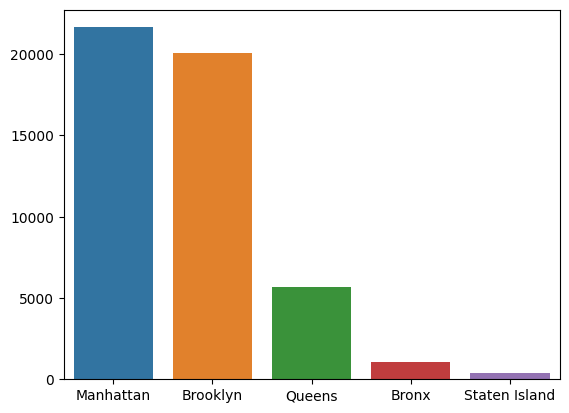

In [22]:
# Vamos explorar os locais com maior número de reservas.
df_bairro_group_counts = df['bairro_group'].value_counts()
sns.barplot(x=df_bairro_group_counts.index, y=df_bairro_group_counts.values)

plt.show()


In [23]:
# Contando a frequência dos valores
print(df_bairro_group_counts)

Manhattan        21653
Brooklyn         20098
Queens            5666
Bronx             1091
Staten Island      373
Name: bairro_group, dtype: int64


#### Os grupos de bairro onde mais tem anúncios são Manhattan e Brooklyn.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

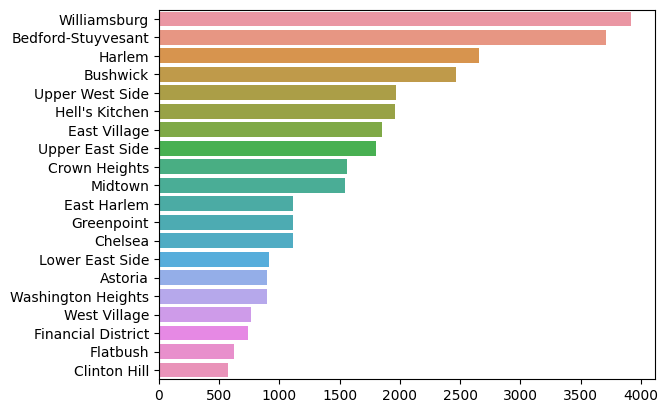

In [24]:
# Quais são os bairros com mais anúncios

# Contando a frequência dos valores
df_bairro_counts = df['bairro'].value_counts()

# Selecionando os 15 mais frequentes
df_top20 = df_bairro_counts.head(20)

# Criando um histograma com seaborn
sns.barplot(y=df_top20.index, x=df_top20.values)
plt.xticks()
plt.show()


#### Bairros com mais anúncios

In [25]:
bairros = ['Williamsburg', 'Bedford-Stuyvesant', 'Harlem', 'Bushwick', 'Upper West Side', "Hell's Kitchen"]

for bairro in bairros:
    df_filtered = df[df['bairro'] == bairro]
    unique_bairro_group = df_filtered['bairro_group'].unique()
    print(f'{bairro}: {unique_bairro_group}')


Williamsburg: ['Brooklyn']
Bedford-Stuyvesant: ['Brooklyn']
Harlem: ['Manhattan']
Bushwick: ['Brooklyn']
Upper West Side: ['Manhattan']
Hell's Kitchen: ['Manhattan']


#### Vamos conferir tambem a quantidade de avaliações por grupo de bairro.

In [26]:
# Agrupando o DataFrame e encontrando o valor máximo
df_grouped = df.groupby('bairro_group')['numero_de_reviews'].max()

print(df_grouped)


bairro_group
Bronx            321
Brooklyn         488
Manhattan        607
Queens           629
Staten Island    333
Name: numero_de_reviews, dtype: int64


#### Apesar de Manhattan ser o grupo de bairros com a maior quantidade de anúncios, a maior parte dos anúncios está concentrada no Brooklyn. No entanto, o Queens se destaca por ter um maior número de avaliações, sejam elas positivas ou negativas, indicando um maior volume de reservas.

#### A questão de o Brooklyn ter mais anúncios do que Manhattan não é tão relevante quando se trata de avaliações, pois é possível que o Brooklyn tenha vários anúncios que nunca foram reservados.

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


#### Aqui vamos ver os anúncios mais caros.

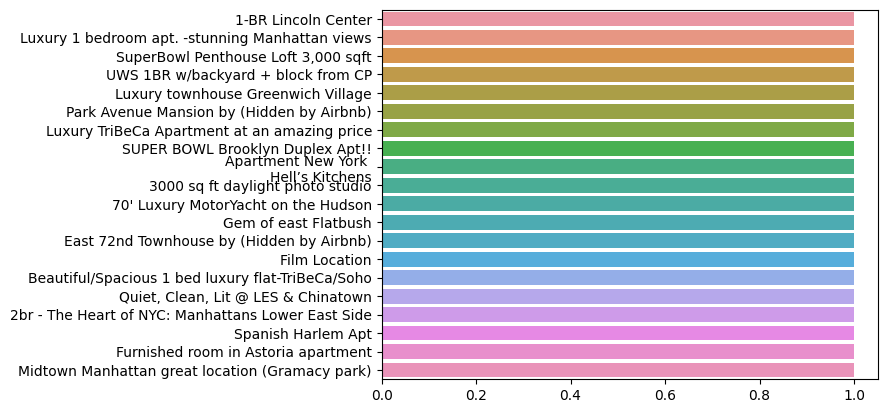

In [27]:
# Ordenando os dados por preço em ordem decrescente
df_sorted = df.sort_values(by='price', ascending=False)

# Selecionando os 20 anúncios mais caros
df_top10 = df_sorted.head(20)

# Contando a frequência dos nomes dos anúncios
df_name_counts = df_top10['nome'].value_counts()

# Criando um gráfico de barras com seaborn
sns.barplot(y=df_name_counts.index, x=df_name_counts.values)
plt.xticks()  # Rotaciona os rótulos do eixo x para melhor visualização
plt.show()


In [28]:
# Ordenando os dados por preço em ordem decrescente
df_sorted = df.sort_values(by='price', ascending=False)

# Selecionando os 20 anúncios mais caros
df_top10 = df_sorted.head(10)

# Contando a frequência dos bairros dos anúncios
df_bairro_counts = df_top10['bairro_group'].value_counts()

print(df_top10)


             id                                               nome  \
29237  22436899                                1-BR Lincoln Center   
17691  13894339    Luxury 1 bedroom apt. -stunning Manhattan views   
9150    7003697                Furnished room in Astoria apartment   
6529    4737930                                 Spanish Harlem Apt   
40432  31340283  2br - The Heart of NYC: Manhattans Lower East ...   
12341   9528920                Quiet, Clean, Lit @ LES & Chinatown   
30267  23377410  Beautiful/Spacious 1 bed luxury flat-TriBeCa/Soho   
4376    2953058                                      Film Location   
29661  22779726          East 72nd Townhouse by (Hidden by Airbnb)   
45665  34895693                               Gem of east Flatbush   

      bairro_group           bairro  latitude  longitude        room_type  \
29237    Manhattan  Upper West Side  40.77213  -73.98665  Entire home/apt   
17691     Brooklyn       Greenpoint  40.73260  -73.95739  Entire home/apt  

Os lugares mais caros possuem uma alta concentração em Manhattan, seguida pelo Brooklyn e depois Queens.

#### Vamos verificar a média de preços por noite 

In [29]:
#Média de preços por noite e por região
mean_prices = df.groupby('bairro_group')['price'].mean()
print(mean_prices)

bairro_group
Bronx             87.496792
Brooklyn         124.390785
Manhattan        196.877569
Queens            99.517649
Staten Island    114.812332
Name: price, dtype: float64


In [30]:
# Média de preços
print(f"Preço mediano por noite : ${df.price.mean():.2f}")
print(f"Preço máximo por noite : ${df.price.max()}")
print(f"Preço minimo por noite : ${df.price.min()}")

Preço mediano por noite : $152.72
Preço máximo por noite : $10000
Preço minimo por noite : $0


#### O preço maximo por noite e a média estão muito distantes provavelmente devem ser poucos os locais que possuem um preço tão elevado.

In [31]:
df[df.price ==10000]


,id,nome,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
9150,7003697,Furnished room in Astoria apartment,Queens,Astoria,40.76810,-73.91651,Private room,10000,100,2,2016-02-13,0.04,1,0
17691,13894339,Luxury 1 bedroom apt. -stunning Manhattan views,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,2017-07-27,0.16,1,0
29237,22436899,1-BR Lincoln Center,Manhattan,Upper West Side,40.77213,-73.98665,Entire home/apt,10000,30,0,0,0.00,1,83


In [32]:
# Vamos conferir a quantidade de anúncios que apresentam um preço por noite superior a 1000.
count = df[df['price'] > 1000]['nome'].nunique()
print(f'A quantidade de anúncios com preço acima de $1000 por noite é {count}.')

A quantidade de anúncios com preço acima de $1000 por noite é 238.


##### Diante de um Dataframe de mais de 40000 linhas e com uma média muito abaixo de $1000, provavelmente muitos anúncios desses serão considerados outliers.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

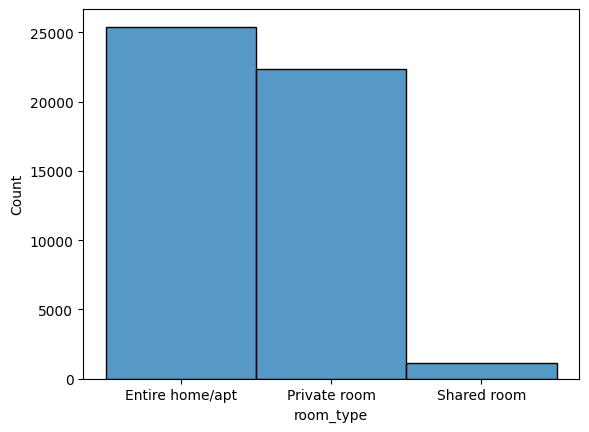

In [33]:
# Aqui será visto qual tipo de quarto é mais procurado.

sns.histplot(data=df, x='room_type')
plt.show()


##### Os tipos de quartos mais procurados são "Entire home/apt" e "Private room".

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

##### Aqui vamos explorar uma correlação visual entre as variáveis 

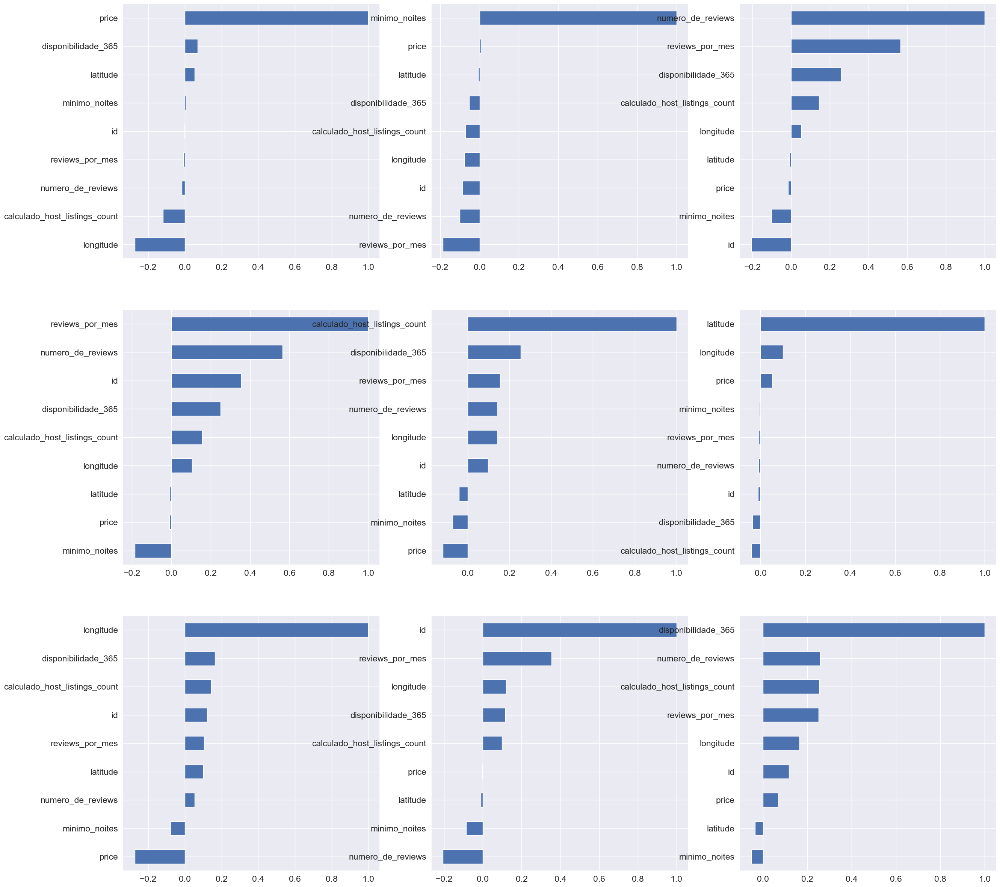

In [46]:
plt.figure(figsize=(30, 30))
sns.set(font_scale=1.5)
i = 1
for column in df.columns:
    if df[column].dtype == "float64" or df[column].dtype == "int64":
        plt.subplot(3, 3, i)
        df.corr(numeric_only=True)[column].sort_values().plot(kind="barh")
        i += 1


#### Verificação de outliers

Vamos realizar uma verificação inicial utilizando boxplot para identificar possíveis outliers.

A coluna 'nome' não é numérica e será ignorada.
A coluna 'bairro_group' não é numérica e será ignorada.
A coluna 'bairro' não é numérica e será ignorada.
A coluna 'room_type' não é numérica e será ignorada.


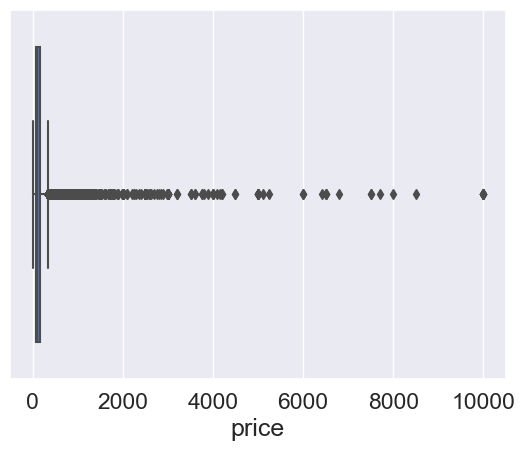

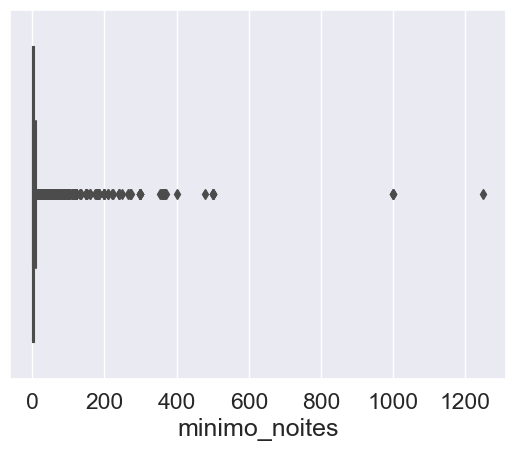

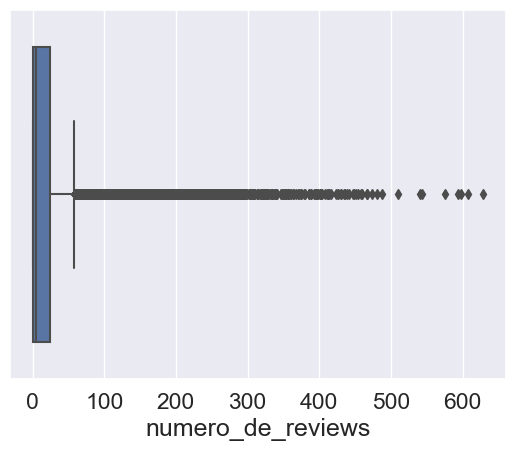

A coluna 'ultima_review' não é numérica e será ignorada.


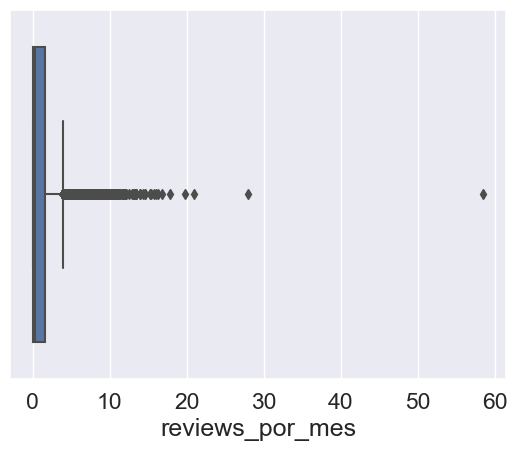

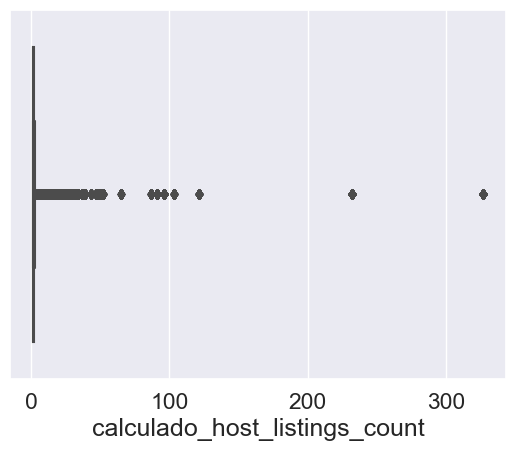

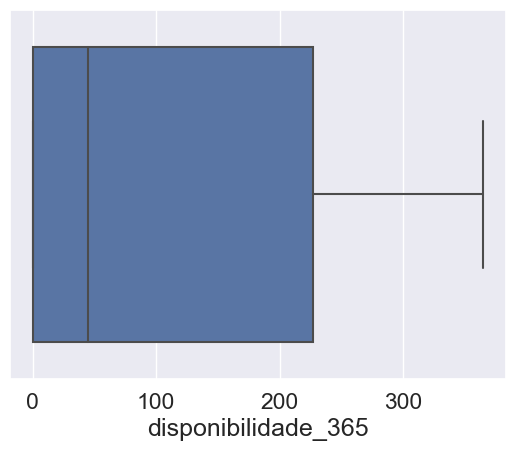

In [35]:
colunas_para_ignorar = ['latitude', 'longitude', 'id']

for col in df.columns:
    if col not in colunas_para_ignorar:
        if pd.api.types.is_numeric_dtype(df[col]):
            sns.boxplot(data=df, x=col)
            plt.show()
        else:
            print(f"A coluna '{col}' não é numérica e será ignorada.")


In [36]:
# Tamanho original do df
df.shape

(48881, 14)

Remoção dos outliers

Intervalo interquartil (IQR): O IQR é a diferença entre o terceiro quartil (Q3) e o primeiro quartil (Q1). Qualquer valor que esteja abaixo de Q1 - 1.5IQR ou acima de Q3 + 1.5IQR pode ser considerado um outlier.

Aqui neste caso vou aumentar o nível de rigorosidade isso significa que estou considerando como outliers os pontos que estão a mais de 2.8 desvios padrão da média.

In [37]:

# Fazendo uma cópia do DataFrame original
df_original = df.copy()

# Lista das colunas que você deseja remover
colunas_para_remover = ['latitude', 'longitude','id','disponibilidade_365']

# Removendo as colunas
df = df.drop(columns=colunas_para_remover)

# Seu código de análise
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Aumentando o fator multiplicativo para ser menos rigoroso
fator = 2.8
df = df[~((df < (Q1 - fator * IQR)) | (df > (Q3 + fator * IQR))).any(axis=1)]

# Adicionando as colunas de volta
df[colunas_para_remover] = df_original[colunas_para_remover]

C:\Users\Matheus\AppData\Local\Temp\ipykernel_46672\618580869.py:11: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q1 = df.quantile(0.25)
C:\Users\Matheus\AppData\Local\Temp\ipykernel_46672\618580869.py:12: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q3 = df.quantile(0.75)
C:\Users\Matheus\AppData\Local\Temp\ipykernel_46672\618580869.py:17: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  df = df[~((df < (Q1 - fator * IQR)) | (df > (Q3 + fator * IQR))).any(axis=1)]


In [38]:
# Após a remoção dos outliers
df.shape

(35584, 14)

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# Data Preparation

In [39]:
# Verificação dos tipos de dados
df.dtypes

nome                              object
bairro_group                      object
bairro                            object
room_type                         object
price                              int64
minimo_noites                      int64
numero_de_reviews                  int64
ultima_review                     object
reviews_por_mes                  float64
calculado_host_listings_count      int64
latitude                         float64
longitude                        float64
id                                 int64
disponibilidade_365                int64
dtype: object

#### Pré-processamento dos Dados

In [40]:
# Separação das variáveis

num_cols = ['latitude', 'longitude', 'minimo_noites', 'numero_de_reviews', 'reviews_por_mes', 'calculado_host_listings_count', 'disponibilidade_365']
cat_cols = ['bairro_group', 'room_type']



In [41]:
# Preprocessador 

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(sparse_output=False), cat_cols)])

In [42]:
# Divisão de dados

X = df.drop(['price','id','nome','ultima_review','bairro'], axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)

### Criação, Treinamento e Avaliação do Modelo

#### Aqui será testado a performace dos modelos.

In [43]:
# Lista de modelos para testar
models = [
    ('Linear Regression', LinearRegression()),
    ('Ridge Regression', Ridge()),
    ('Lasso Regression', Lasso()),
    ('Decision Tree', DecisionTreeRegressor()),
    ('Random Forest', RandomForestRegressor()),
    ('Gradient Boosting', GradientBoostingRegressor()),
    ('Support Vector Machines', SVR())
]

for name, model in models:
    # Crie uma pipeline para cada modelo
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('model', model)])
    
    # Treine o modelo
    pipeline.fit(X_train, y_train)
    
    # Faça previsões no conjunto de teste
    y_pred = pipeline.predict(X_test)
    
    # Calcule o RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    # Calcule o MAE
    mae = mean_absolute_error(y_test, y_pred)
    
    print(f'{name} RMSE: {rmse}, MAE: {mae}')

Linear Regression RMSE: 62.08366586250591, MAE: 43.460067223935525
Ridge Regression RMSE: 62.083748100586064, MAE: 43.45918745773223
Lasso Regression RMSE: 62.63460485940161, MAE: 43.7266952907748
Decision Tree RMSE: 82.19271247490263, MAE: 55.23731909512435
Random Forest RMSE: 58.83150053164882, MAE: 40.44637557959814
Gradient Boosting RMSE: 58.27192998996587, MAE: 39.6331724707823
Support Vector Machines RMSE: 63.423748234507634, MAE: 40.18745281259914


##### O melhor desempenho foi o modelo GradientBoostingRegressor

In [44]:
# Modelo
model = GradientBoostingRegressor()

# Pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('model', model)])

# Treinamento do modelo
pipeline.fit(X_train, y_train)

# Avaliação do modelo
y_pred = pipeline.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse}')

# Previsão
new_data = pd.DataFrame([{
 'id': 2595,
 'nome': 'Skylit Midtown Castle',
 'host_id': 2845,
 'host_name': 'Jennifer',
 'bairro_group': 'Manhattan',
 'bairro': 'Midtown',
 'latitude': 40.75362,
 'longitude': -73.98377,
 'room_type': 'Entire home/apt',
 'minimo_noites': 1,
 'numero_de_reviews': 45,
 'ultima_review': '2019-05-21',
 'reviews_por_mes': 0.38,
 'calculado_host_listings_count': 2,
 'disponibilidade_365': 355}])
predicted_price = pipeline.predict(new_data)
print(f'O preço sugerido para o apartamento é: {predicted_price[0]}')



RMSE: 58.2707894270197
O preço sugerido para o apartamento é: 258.39669885351077


Aqui vamos testar com vários parâmetros diferentes

In [49]:
# Definindo os parâmetros para a pesquisa em grade
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__learning_rate': [0.01, 0.1, 1],
    'model__max_depth': [3, 5, 7]
}

# Inicializando a pesquisa em grade
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')

# Treinando o modelo
grid_search.fit(X_train, y_train)

# Avaliando o modelo
y_pred = grid_search.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse}')




In [ ]:
# Obtendo a melhor combinação de parâmetros
melhores_parametros = grid_search.best_params_

# Imprimindo os melhores parâmetros
print(melhores_parametros)


AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

In [ ]:
# Obtendo o melhor estimador
melhor_modelo = grid_search.best_estimator_

# Imprimindo o melhor modelo
print(melhor_modelo)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['latitude', 'longitude',
                                                   'minimo_noites',
                                                   'numero_de_reviews',
                                                   'reviews_por_mes',
                                                   'calculado_host_listings_count',
                                                   'disponibilidade_365']),
                                                 ('cat',
                                                  OneHotEncoder(sparse=False),
                                                  ['bairro_group',
                                                   'room_type'])])),
                ('model', GradientBoostingRegressor(n_estimators=300))])


Aplicação com os melhores parametros

In [47]:
# Modelo
model = GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=300)


# Pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('model', model)])

# Treinamento do modelo
pipeline.fit(X_train, y_train)

# Avaliação do modelo
y_pred = pipeline.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse}')

# Previsão
new_data = pd.DataFrame([{
 'id': 2595,
 'nome': 'Skylit Midtown Castle',
 'host_id': 2845,
 'host_name': 'Jennifer',
 'bairro_group': 'Manhattan',
 'bairro': 'Midtown',
 'latitude': 40.75362,
 'longitude': -73.98377,
 'room_type': 'Entire home/apt',
 'minimo_noites': 1,
 'numero_de_reviews': 45,
 'ultima_review': '2019-05-21',
 'reviews_por_mes': 0.38,
 'calculado_host_listings_count': 2,
 'disponibilidade_365': 355}])
predicted_price = pipeline.predict(new_data)
print(f'O preço sugerido para o apartamento é: {predicted_price[0]}')

RMSE: 58.00800435363875
O preço sugerido para o apartamento é: 279.5952925800087


### Aqui está o preço sugerido para o apartamento 

## Avaliação do Modelo

In [48]:
# Faça previsões no conjunto de teste
y_pred = pipeline.predict(X_test)

# Calcule as métricas
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')


MSE: 3364.9285690917723
RMSE: 58.00800435363875
MAE: 39.44190941022736
R²: 0.4948262730380645


#### Depois de fazer alguns ajustes e melhorar o modelo juntamente com um tratamento eficaz de outliers, obtivemos um coeficiente de determinação (R²) de 50%. Isso indica que nosso modelo pode explicar 50% da variância nos dados. Além disso, o (RMSE) foi de 58, o que sugere que as previsões do nosso modelo podem, em média, desviar-se em 58 pontos do valor real. Isso se aplica ao preço do apartamento, o que significa que o preço previsto pode ter uma diferença média de 58 pontos em relação ao preço real. Se fôssemos mais rigorosos na remoção de outliers, talvez conseguíssemos melhorar esses números. Mas é importante lembrar que, ao remover mais outliers, podemos acabar perdendo informações importantes.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## Respondendo às questões sugeridas.

A).	Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, onde seria mais indicada a compra?

R:  A melhor opção seria o Queens, pois apresenta um número elevado de avaliações em comparação com outras áreas, indicando um maior volume de reservas. Além disso, a preferência tende a ser por locais completos e privados.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


b).	O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?

R: Existe uma correlação positiva entre as colunas que é fraca, no entanto após o tratamento dos dados e principalmente a remoção dos outliers essas observações mudam.
Antes de remoção é possivel ver uma correlação , após a remoção alguma correlações ficam até razoavelmente negativas.
Então provavelmente em alguns casos de preços mais elevados existe uma correlação do contrário não.

C:\Users\Matheus\AppData\Local\Temp\ipykernel_38440\2056636664.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()[column].sort_values().plot(kind="barh")
C:\Users\Matheus\AppData\Local\Temp\ipykernel_38440\2056636664.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()[column].sort_values().plot(kind="barh")


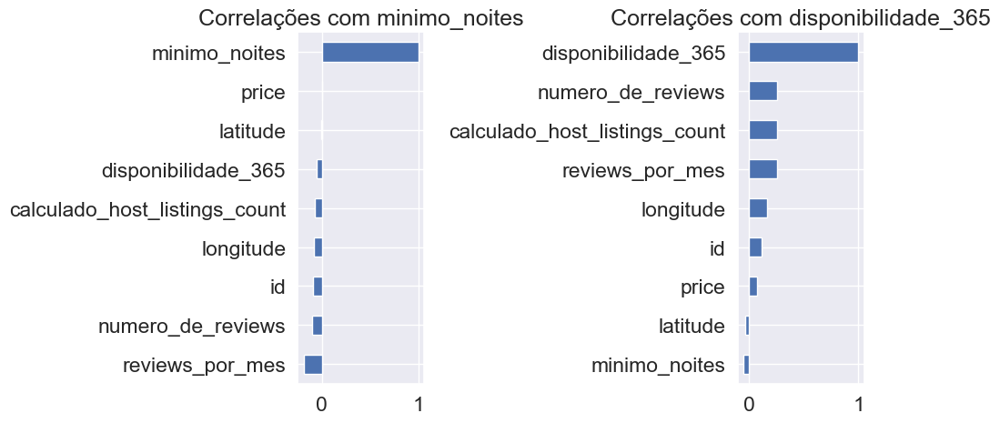

In [ ]:
# Correlação

cols = ['minimo_noites', 'disponibilidade_365']

plt.figure(figsize=(10, 5))
sns.set(font_scale=1.5)

for i, column in enumerate(cols, 1):
    plt.subplot(1, 2, i)
    df.corr()[column].sort_values().plot(kind="barh")
    plt.title(f'Correlações com {column}')

plt.tight_layout()
plt.show()


Correlação sem remoção de outliers

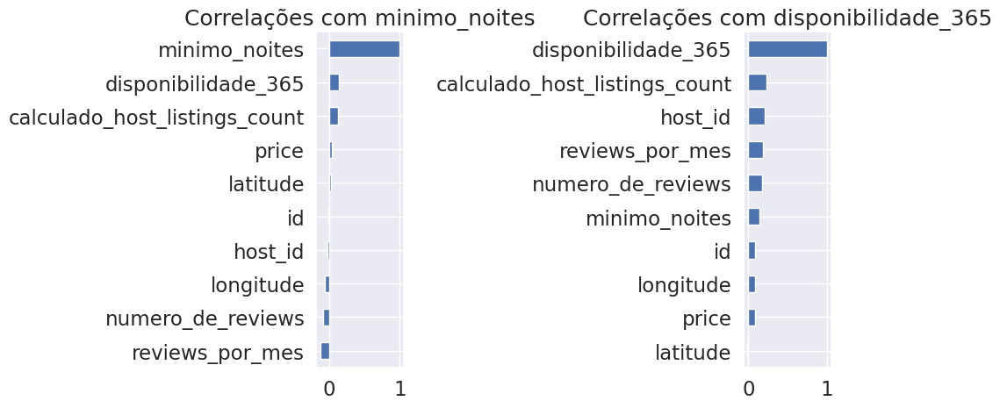

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

c).	Existe algum padrão no texto do nome do local para lugares de mais alto valor?

R: A resposta é sim! Palavras como "Luxury", "Private","Townhouse", "Bedroom", "Loft" são as mais "gritam" na nuvem de palavras, logo abaixo onde foram selecionados apenas anúncios com preço acima de $1000 por noite.


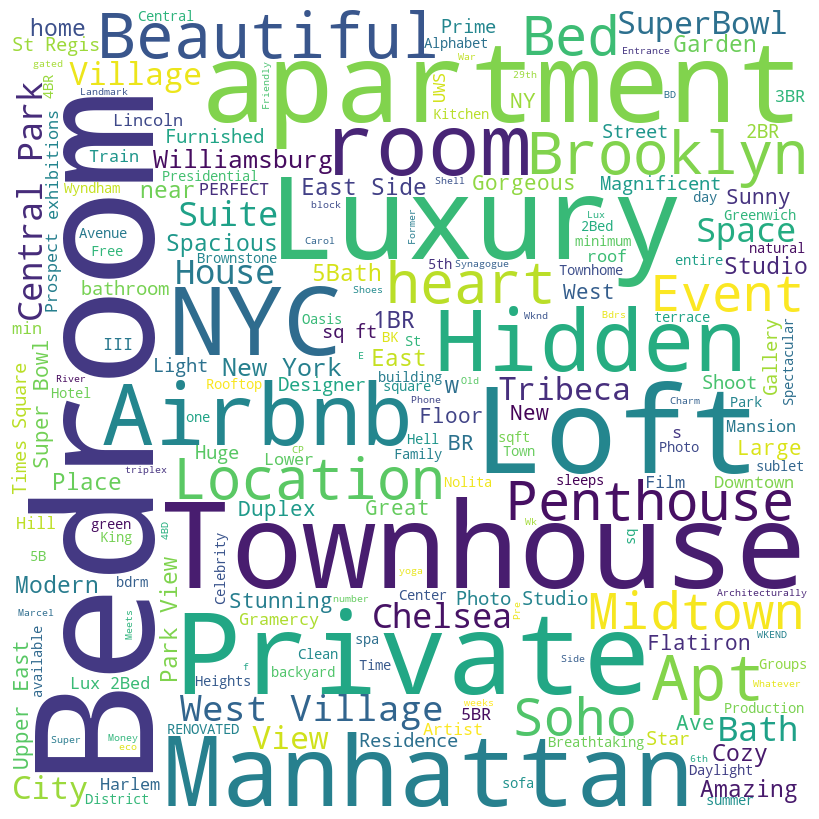

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

##### 3.)Explique como você faria a previsão do preço a partir dos dados. Quais variáveis e/ou suas transformações você utilizou e por quê? Qual tipo de problema estamos resolvendo (regressão, classificação)? Qual modelo melhor se aproxima dos dados e quais seus prós e contras? Qual medida de performance do modelo foi escolhida e por quê?

#### Explique como você faria a previsão do preço a partir dos dados

A partir desse modelo já 'tunado' com os melhores hiperparâmetros é possivel explicar a previsão de preço a partir dos dados.

In [ ]:
# Modelo
model = GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=300)


# Pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('model', model)])

# Treinamento do modelo
pipeline.fit(X_train, y_train)

# Avaliação do modelo
y_pred = pipeline.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse}')

# Previsão
new_data = pd.DataFrame([{
 'id': 2595,
 'nome': 'Skylit Midtown Castle',
 'host_id': 2845,
 'host_name': 'Jennifer',
 'bairro_group': 'Manhattan',
 'bairro': 'Midtown',
 'latitude': 40.75362,
 'longitude': -73.98377,
 'room_type': 'Entire home/apt',
 'minimo_noites': 1,
 'numero_de_reviews': 45,
 'ultima_review': '2019-05-21',
 'reviews_por_mes': 0.38,
 'calculado_host_listings_count': 2,
 'disponibilidade_365': 355}])
predicted_price = pipeline.predict(new_data)
print(f'O preço sugerido para o apartamento é: {predicted_price[0]}')

RMSE: 58.01090778283009
O preço sugerido para o apartamento é: 279.5952925800086


------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### Quais variáveis e/ou suas transformações você utilizou e por quê?

##### Aqui estão as variaveis que foram utilizadas colunas númericas e categóricas.

num_cols = ['latitude', 'longitude', 'minimo_noites', 'numero_de_reviews', 'reviews_por_mes', 'calculado_host_listings_count', 'disponibilidade_365']

cat_cols = ['bairro_group', 'room_type']



##### As transformações utilizadas estão aqui.

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(sparse=False), cat_cols)])


##### Para as colunas numéricas, usamos o StandardScaler, que padroniza os recursos removendo a média e escalonando para a variância unitária. Isso é útil porque muitos algoritmos de machine learning performam melhor quando os recursos numéricos estão na mesma escala.


##### Para as colunas categóricas, usamos o OneHotEncoder, que converte variáveis categóricas em uma forma que pode ser fornecida aos algoritmos de machine learning. Ele faz isso criando novas colunas binárias para cada categoria da variável original.


------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### Qual tipo de problema estamos resolvendo (regressão, classificação)?

Estamos resolvendo um problema de regressão pois o objetivo é prever um valor contínuo no caso, o preço de um apartamento.

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### Qual modelo melhor se aproxima dos dados e quais seus prós e contras?

O modelo que apresentou a melhor precisão foi o GradientBoostingRegressor. No entanto, um ponto negativo foi a necessidade de remover uma grande quantidade de outliers para alcançar esse resultado.

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### Qual medida de performance do modelo foi escolhida e por quê?

O RMSE foi escolhido como a métrica para avaliar o desempenho do modelo de regressão. O RMSE é frequentemente usado porque atribui maior peso aos erros maiores, pois os erros são elevados ao quadrado antes de calcular a média. Assim, o principal objetivo era otimizar o modelo de forma a minimizar até mesmo os erros mais significativos. Isso para ajudar a garantir que o modelo fosse mais preciso possível, mesmo em casos extremos.